In [1]:
import os
import tensorflow as tf
from tensorflow.keras.optimizers import RMSprop
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import random
from tensorflow.keras.preprocessing.image import img_to_array, load_img

In [2]:
tf.random.set_seed(24)

In [3]:
dataset_path = 'data_animal\\'
train_dir = os.path.join(dataset_path, 'train')
valid_dir = os.path.join(dataset_path, 'validation')
test_dir = os.path.join(dataset_path, 'test')

train_cats_dir = os.path.join(train_dir, 'cats')
train_dogs_dir = os.path.join(train_dir, 'dogs')
train_pandas_dir = os.path.join(train_dir, 'pandas')

valid_cats_dir = os.path.join(valid_dir, 'cats')
valid_dogs_dir = os.path.join(valid_dir, 'dogs')
valid_pandas_dir = os.path.join(valid_dir, 'pandas')

model_file = 'data_animal\\animal.h5'

In [4]:
print("\nContents of train directory:")
print(os.listdir(f'{dataset_path}\\train'))
print("\nContents of validation directory:")
print(os.listdir(f'{dataset_path}\\validation'))


Contents of train directory:
['cats', 'dogs', 'pandas']

Contents of validation directory:
['cats', 'dogs', 'pandas']


In [5]:
train_cat_fnames = os.listdir(train_cats_dir)
train_dog_fnames = os.listdir(train_dogs_dir)
train_panda_fnames = os.listdir(train_pandas_dir)

In [6]:
print('total training cat images :', len(os.listdir(train_cats_dir)))
print('total training dog images :', len(os.listdir(train_dogs_dir)))
print('total training panda images :', len(os.listdir(train_pandas_dir)))

print('total validation cat images :', len(os.listdir(valid_cats_dir)))
print('total validation dog images :', len(os.listdir(valid_dogs_dir)))
print('total validation panda images :', len(os.listdir(valid_pandas_dir)))

total training cat images : 1027
total training dog images : 1018
total training panda images : 1004
total validation cat images : 500
total validation dog images : 500
total validation panda images : 501


In [7]:
%matplotlib inline
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

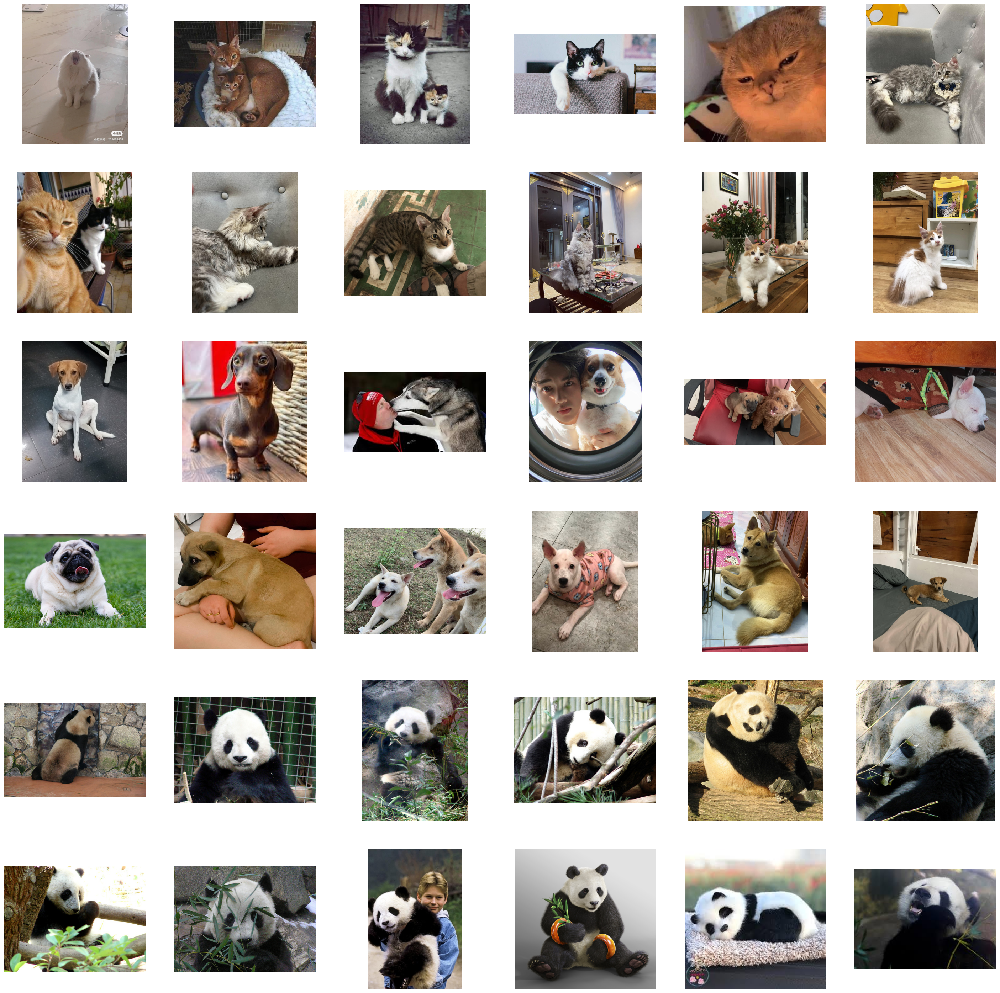

In [8]:
nrows = 6
ncols = 6
pic_index = 0

fig = plt.gcf()
fig.set_size_inches(ncols*6, nrows*6)
pic_index+=12
next_cat_pix = [os.path.join(train_cats_dir, fname)
                for fname in train_cat_fnames[pic_index-12:pic_index]
                ]
next_dog_pix = [os.path.join(train_dogs_dir, fname)
                for fname in train_dog_fnames[pic_index-12:pic_index]
                ]
next_panda_pix = [os.path.join(train_pandas_dir, fname)
                for fname in train_panda_fnames[pic_index-12:pic_index]
                ]
for i, img_path in enumerate(next_cat_pix+next_dog_pix+next_panda_pix):
    sp = plt.subplot(nrows, ncols, i + 1)
    sp.axis('Off')
    img = mpimg.imread(img_path)
    plt.imshow(img)
plt.show()

In [9]:
size = 224
train_datagen = ImageDataGenerator(rescale=1.0/255.)
test_datagen = ImageDataGenerator(rescale=1.0/255.)

train_generator = train_datagen.flow_from_directory(train_dir,
                                                    batch_size=20,
                                                    class_mode='categorical',
                                                    target_size=(size, size))
valid_generator = test_datagen.flow_from_directory(valid_dir,
                                                   batch_size=20,
                                                   class_mode = 'categorical',
                                                   target_size = (size, size))

Found 3049 images belonging to 3 classes.
Found 1501 images belonging to 3 classes.


In [10]:
all_x = []
all_y = []
for batch_x, batch_y in train_generator:
    all_x.append(batch_x)
    all_y.append(batch_y)
    if train_generator.samples // train_generator.batch_size == len(all_x):
        break

x_train = np.concatenate(all_x)
y_train = np.concatenate(all_y)

all_x = []
all_y = []
for batch_x, batch_y in valid_generator:
    all_x.append(batch_x)
    all_y.append(batch_y)
    if valid_generator.samples // valid_generator.batch_size == len(all_x):
        break
        
x_val = np.concatenate(all_x)
y_val = np.concatenate(all_y)

In [11]:
X_train = x_train.reshape((3040, size * size * 3))
X_val = x_val.reshape((1500, size * size * 3))

In [12]:
Y_train = np.argmax(y_train, axis=1)
Y_val = np.argmax(y_val, axis=1)

In [13]:
new_labels = []
for label in Y_train:
    if label == 0:
        new_labels.append("cat")
    elif label == 1:
        new_labels.append("dog")
    else:
        new_labels.append("panda")

In [14]:
def plot_scatter_2d(pc1, pc2):
    fig, ax = plt.subplots(figsize=(10, 8))
    species_unique = list(set(new_labels))
    species_colors = ["r","b","g"]
    for i, spec in enumerate(new_labels):
        plt.scatter(pc1[i], pc2[i], label = spec, s = 20, c=species_colors[species_unique.index(spec)])
        #ax.annotate(str(i+1), (pc1[i],pc2[i]))
    from collections import OrderedDict
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = OrderedDict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(), prop={'size': 15}, loc=4)
    ax.set_xlabel('Principal Component 1', fontsize = 15)
    ax.set_ylabel('Principal Component 2', fontsize = 15)
    ax.axhline(y=0, color="grey", linestyle="--")
    ax.axvline(x=0, color="grey", linestyle="--")
    plt.grid()
    plt.axis([-400, 400, -200, 200])
    plt.show()

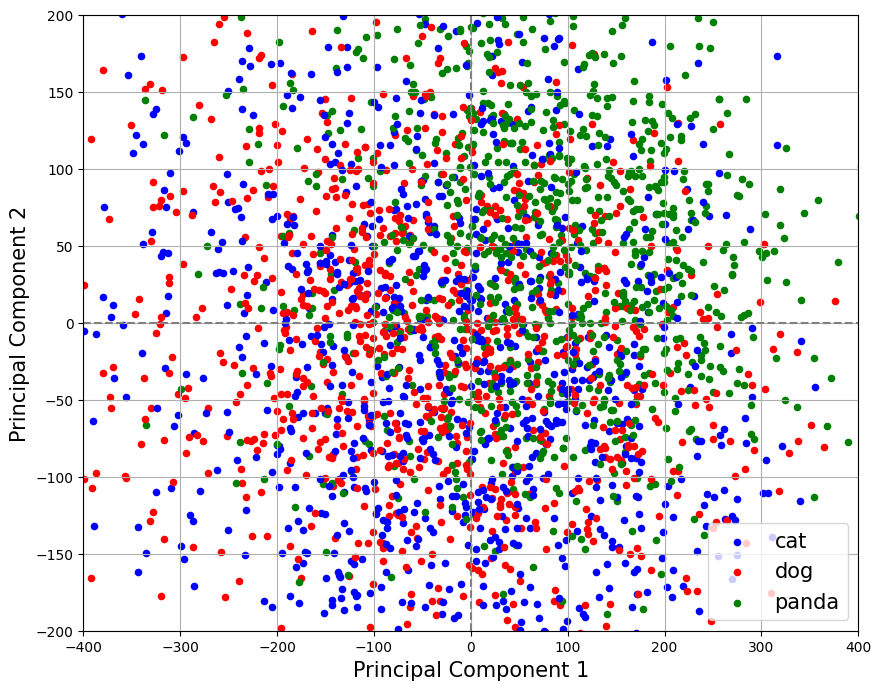

In [15]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

X = StandardScaler().fit_transform(X_train)
pca_2d = PCA(n_components=2)
result = pca_2d.fit_transform(X)

pc1 = - result[:,0]
pc2 = - result[:,1]
plot_scatter_2d(pc1, pc2)

In [16]:
def plot_scatter_3d(pc1, pc2, pc3):
    fig = plt.figure(figsize=(40, 30))
    ax = fig.add_subplot(221, projection='3d')
    species_unique = list(set(new_labels))
    species_colors = ["r","b","g"]
    alpha=0.4
    for i, spec in enumerate(new_labels):
        ax.scatter(pc3D_1[i], pc3D_2[i], pc3D_3[i], label = spec, s = 10, c=species_colors[species_unique.index(spec)])
    from collections import OrderedDict
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = OrderedDict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(), prop={'size': 15}, loc=4)
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_zlabel('Principal Component 3')

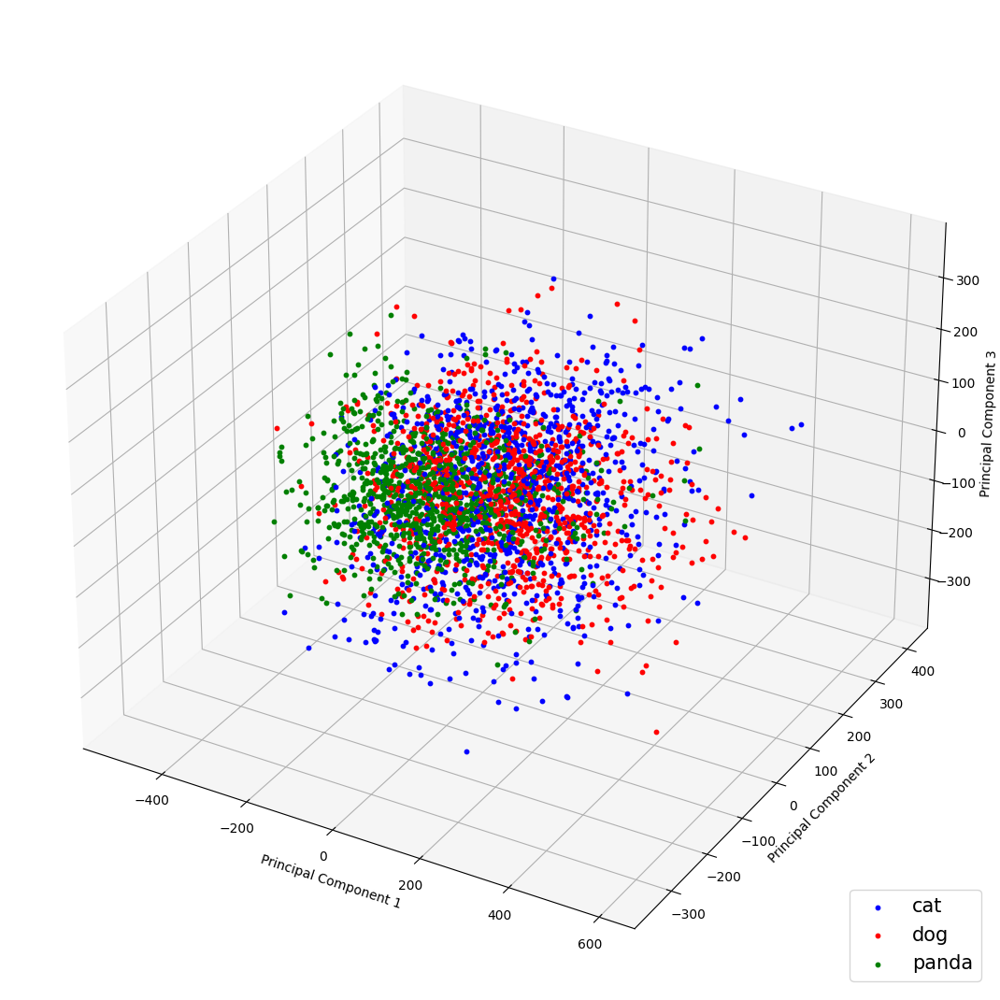

In [17]:
pca_3d = PCA(n_components=3)
result_3D = pca_3d.fit_transform(X)

pc3D_1 =  result_3D[:,0]
pc3D_2 =  result_3D[:,1]
pc3D_3 =  result_3D[:,2]
plot_scatter_3d(pc3D_1, pc3D_2, pc3D_3)

In [18]:
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.layers import Flatten, Dense

In [19]:
model = VGG16(weights='imagenet', include_top=False, input_shape=(size, size, 3))
for layer in model.layers:
    layer.trainable = False

In [20]:
x = model.output
x = Flatten()(x)
x = Dense(128, activation='relu')(x)
predictions = Dense(3, activation='softmax')(x)

In [21]:
from tensorflow.keras.models import Model

In [22]:
model = Model(inputs=model.input, outputs=predictions)

In [23]:
model.compile(loss='categorical_crossentropy', 
              optimizer='adam', 
              metrics=['accuracy'])
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

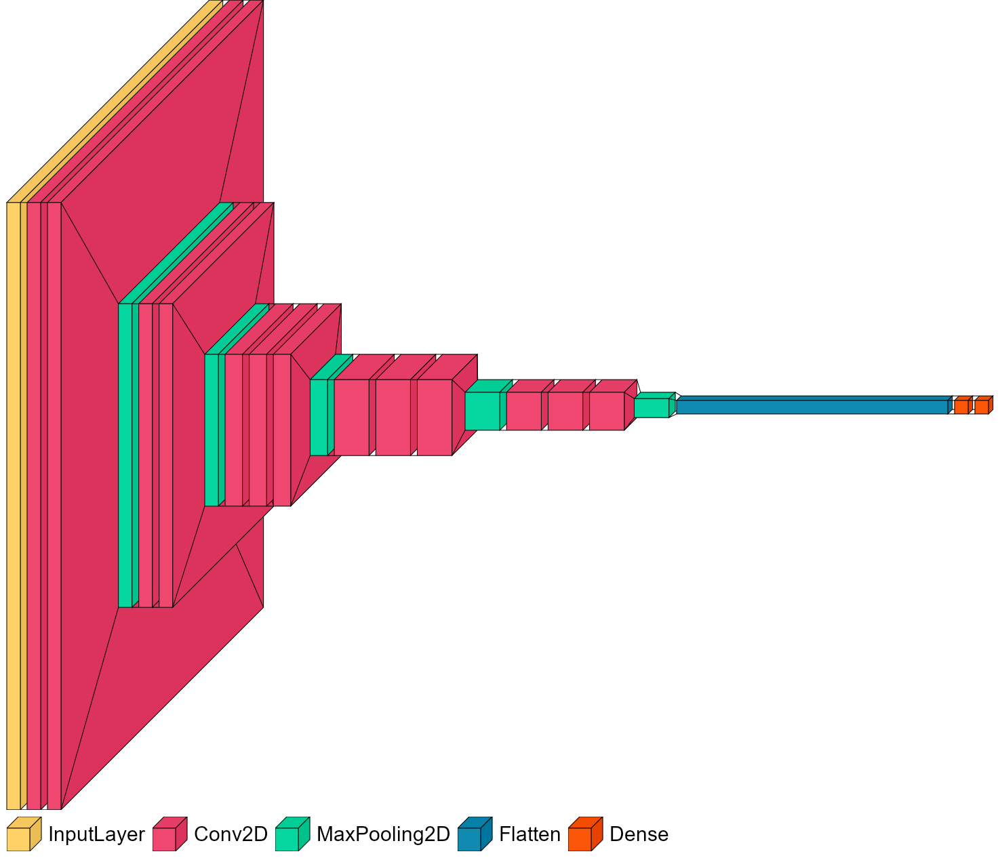

In [24]:
import visualkeras
from collections import defaultdict
from tensorflow.keras import layers
from PIL import ImageFont
font = ImageFont.truetype("arial.ttf", 30)
color_map = defaultdict(dict)
color_map[layers.Dense]['fill'] = '#fb5607'

visualkeras.layered_view(model, to_file='model.png', legend=True, font=font, color_map=color_map)

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
callbacks = [
    ModelCheckpoint(model_file, verbose = 1, save_best_only = True),
    EarlyStopping(monitor = "val_loss", patience = 5, restore_best_weights=False)
]

In [ ]:
history = model.fit(
    train_generator,
    epochs=30,
    validation_data=valid_generator,
    callbacks=[callbacks]
)

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.show()

In [25]:
from sklearn.metrics import f1_score , accuracy_score
from tensorflow.keras.models import load_model

In [26]:
best_model = load_model(model_file)
pred = best_model.predict(x_val)
preds = []
for i in pred:
    out = np.argmax(i)
    preds.append(out)
f1score = f1_score(Y_val, preds, average='micro')
accuracy = accuracy_score(Y_val, preds)


47/47 [==============================] - 109s 1s/step


In [27]:
from sklearn.metrics import classification_report

report = classification_report(Y_val, preds, target_names=['cat', 'dog', 'panda'])
print(report)

              precision    recall  f1-score   support

         cat       0.89      0.90      0.89       500
         dog       0.89      0.86      0.88       499
       panda       0.92      0.95      0.93       501

    accuracy                           0.90      1500
   macro avg       0.90      0.90      0.90      1500
weighted avg       0.90      0.90      0.90      1500



In [28]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(Y_val, preds)
classes = ['cat', 'dog', 'panda']

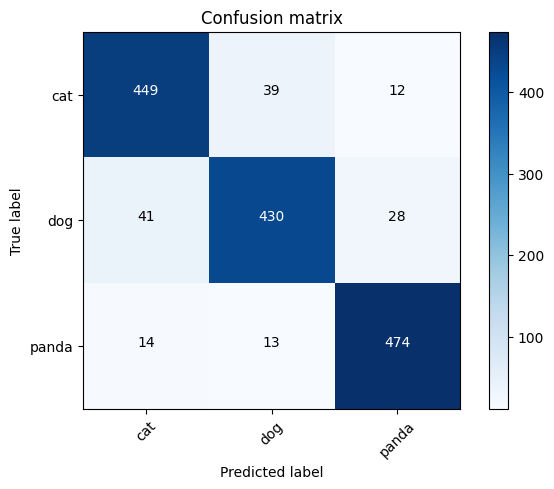

In [29]:
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion matrix')
plt.colorbar()
tick_marks = np.arange(3)
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)
fmt = 'd'
thresh = cm.max() / 2.
for i, j in np.ndindex(cm.shape):
    plt.text(j, i, format(cm[i, j], fmt),
             horizontalalignment="center",
             color="white" if cm[i, j] > thresh else "black")
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [30]:
print("Valid Accuracy:", round(accuracy, 2))
print("F1 score:", round(f1score, 2))

Valid Accuracy: 0.9
F1 score: 0.9


In [31]:
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array

In [32]:
def predict_label(label):
    if label == 0:
        return 'cat'
    elif label == 1:
        return 'dog'
    else:
        return 'panda'

In [33]:
def img_to_predict(img_path):
    img = load_img(img_path, target_size=(size, size))
    x = img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = x / 255.0
    prediction = best_model.predict(x, verbose=0)
    label = np.argmax(prediction)  
    label = predict_label(label)
    return label

In [34]:
classes = []
for path in os.listdir(test_dir):
    filename = path.split('.')
    classes.append(filename[0])

i=0
for path in os.listdir(test_dir):
    filename = path.split('.')
    pred = img_to_predict(os.path.join(test_dir, path))
    if classes[i-1] != classes[i]:
        print('----')
        print(filename[0].upper())
        print('----')
    print(path, ':', pred)
    i += 1


----
CAT
----
cat.1.jpg : cat
cat.10.jpg : cat
cat.11.jpg : cat
cat.12.jpg : cat
cat.13.jpg : cat
cat.14.jpg : dog
cat.15.jpg : cat
cat.16.jpg : dog
cat.17.jpg : dog
cat.18.jpg : cat
cat.19.jpg : cat
cat.2.jpg : cat
cat.20.jpg : dog
cat.3.jpg : panda
cat.4.jpg : dog
cat.5.jpg : cat
cat.6.jpg : cat
cat.7.jpg : cat
cat.8.jpg : cat
cat.9.jpg : cat
----
DOG
----
dog.1.jpg : dog
dog.10.jpg : dog
dog.11.jpg : dog
dog.12.jpg : dog
dog.13.jpg : cat
dog.14.jpg : dog
dog.15.jpg : dog
dog.16.jpg : dog
dog.17.jpg : dog
dog.18.jpg : dog
dog.19.jpg : panda
dog.2.jpg : dog
dog.20.jpg : dog
dog.3.jpg : panda
dog.4.jpg : dog
dog.5.jpg : panda
dog.6.jpg : panda
dog.7.jpg : dog
dog.8.jpg : dog
dog.9.jpg : dog
----
PANDA
----
panda.1.jpg : panda
panda.10.png : panda
panda.11.jpg : panda
panda.12.png : panda
panda.13.jpg : panda
panda.14.png : panda
panda.15.jpg : panda
panda.16.png : panda
panda.17.png : cat
panda.18.png : panda
panda.19.png : panda
panda.2.png : panda
panda.20.png : panda
panda.3.png : c

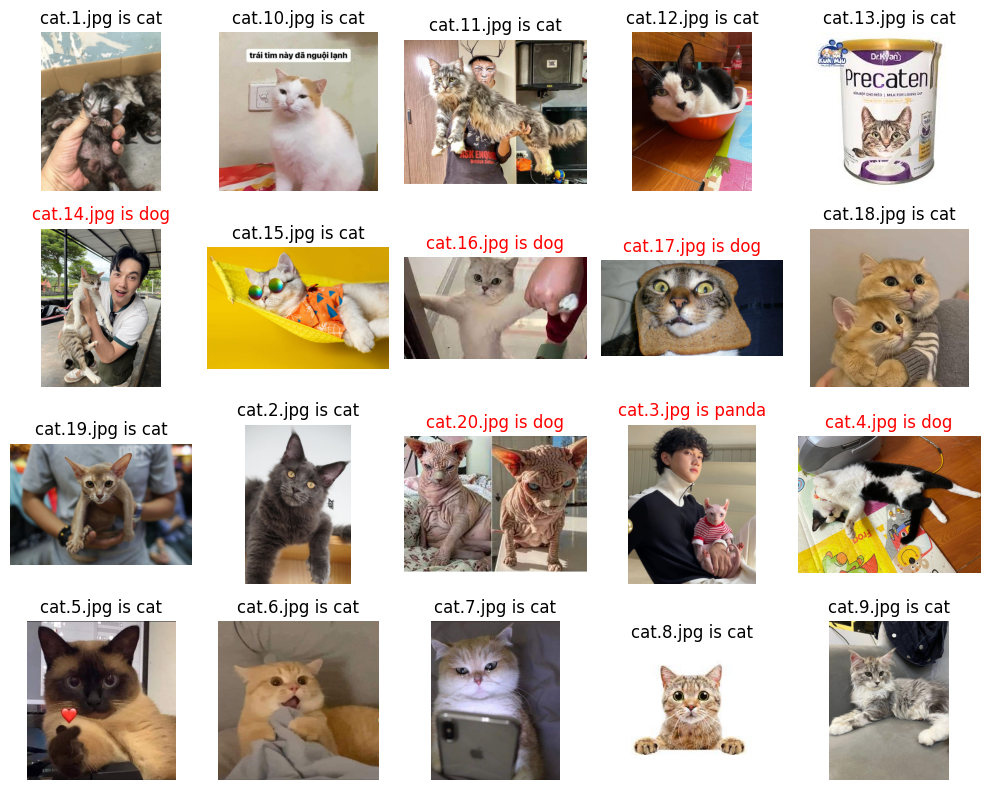

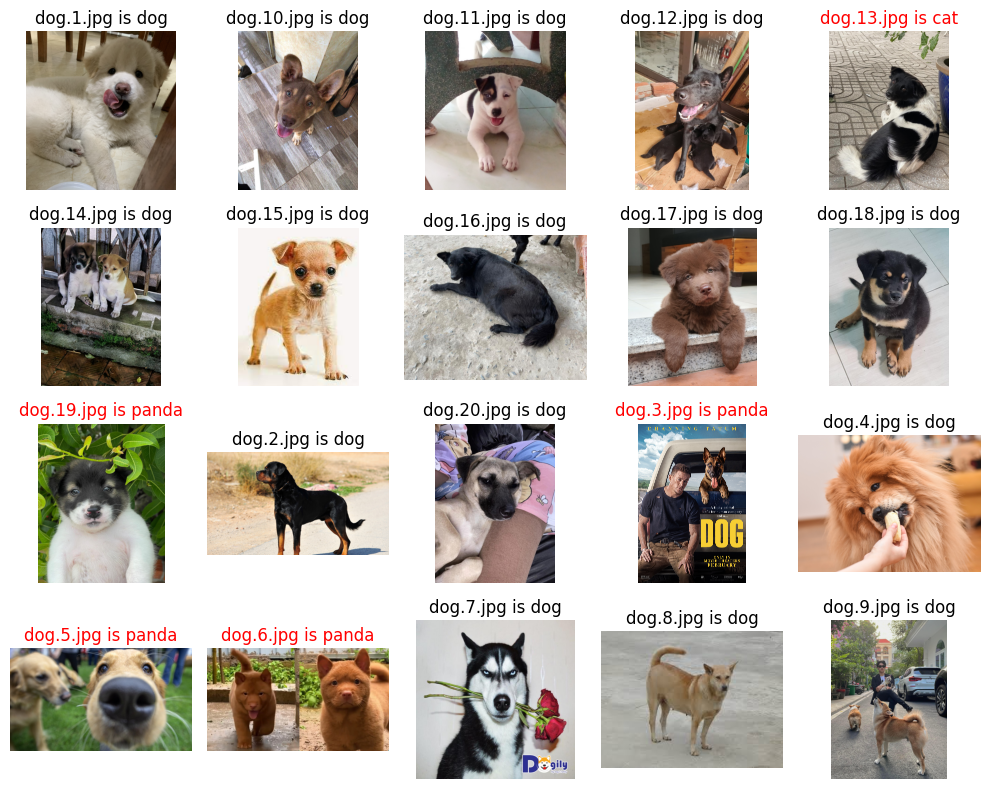

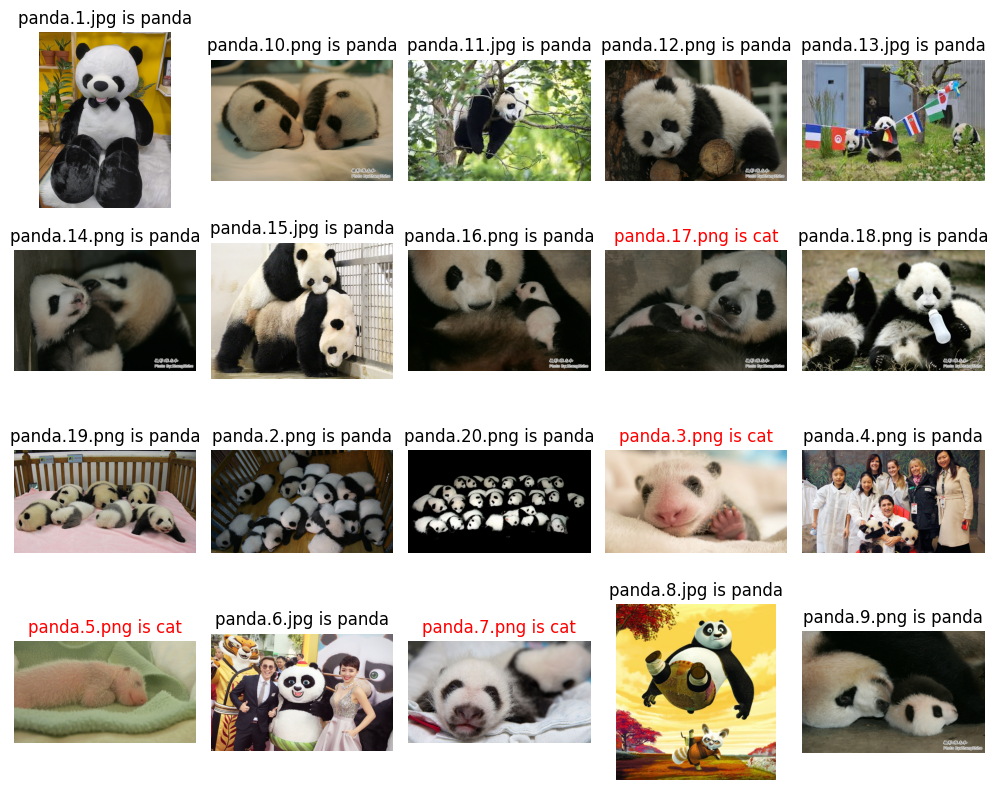

In [45]:
image_paths = [i for i in os.listdir(test_dir)]
images1 = image_paths[:20]
images2 = image_paths[20:40]
images3 = image_paths[40:]

for i, images in enumerate([images1, images2, images3]):
    fig = plt.figure(figsize=(10, 8))
    for j, image_path in enumerate(images):
        ax = fig.add_subplot(4, 5, j+1)
        image = load_img(os.path.join(test_dir, image_path))
        plt.imshow(image)
        pred = img_to_predict(os.path.join(test_dir, image_path))
        if pred == image_path.split('.')[0]:
            plt.title(f'{image_path} is {img_to_predict(os.path.join(test_dir, image_path))}')
        else:
            plt.title(f'{image_path} is {img_to_predict(os.path.join(test_dir, image_path))}', color='red')
        ax.axis('off')

    plt.tight_layout()
    plt.show()
    plt.close(fig)             